# Necessary Packages

In [1]:
import os
import zipfile
import pandas as pd

import random
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision.transforms import transforms
import torchvision.datasets as dset
import torchvision.utils as vutils

import matplotlib.pyplot as plt

# Download dataset

In [2]:

os.environ['KAGGLE_USERNAME'] = "" # username from the json file
os.environ['KAGGLE_KEY'] = "" # key from the json file
! kaggle datasets download -d vishalsubbiah/pokemon-images-and-types # api copied from kaggle
import zipfile
zip = zipfile.ZipFile('pokemon-images-and-types.zip')
zip.extractall()
! mkdir Pokemon && mv images Pokemon

Dataset URL: https://www.kaggle.com/datasets/vishalsubbiah/pokemon-images-and-types
License(s): Attribution 4.0 International (CC BY 4.0)
  0% 0.00/3.68M [00:00<?, ?B/s]
100% 3.68M/3.68M [00:00<00:00, 120MB/s]


# Configuration

In [16]:
config = {"seed":1314520,
          "batch_size":128,
          "lr":5e-5,
          "beta": 0.5,
          "epochs":800}
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

# Fixing random seed

In [4]:
def same_seed(seed):
    torch.backends.cuda.deterministic = True
    torch.backends.cuda.benchmark = False
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
same_seed(config["seed"])

# Create Formatted Dataset

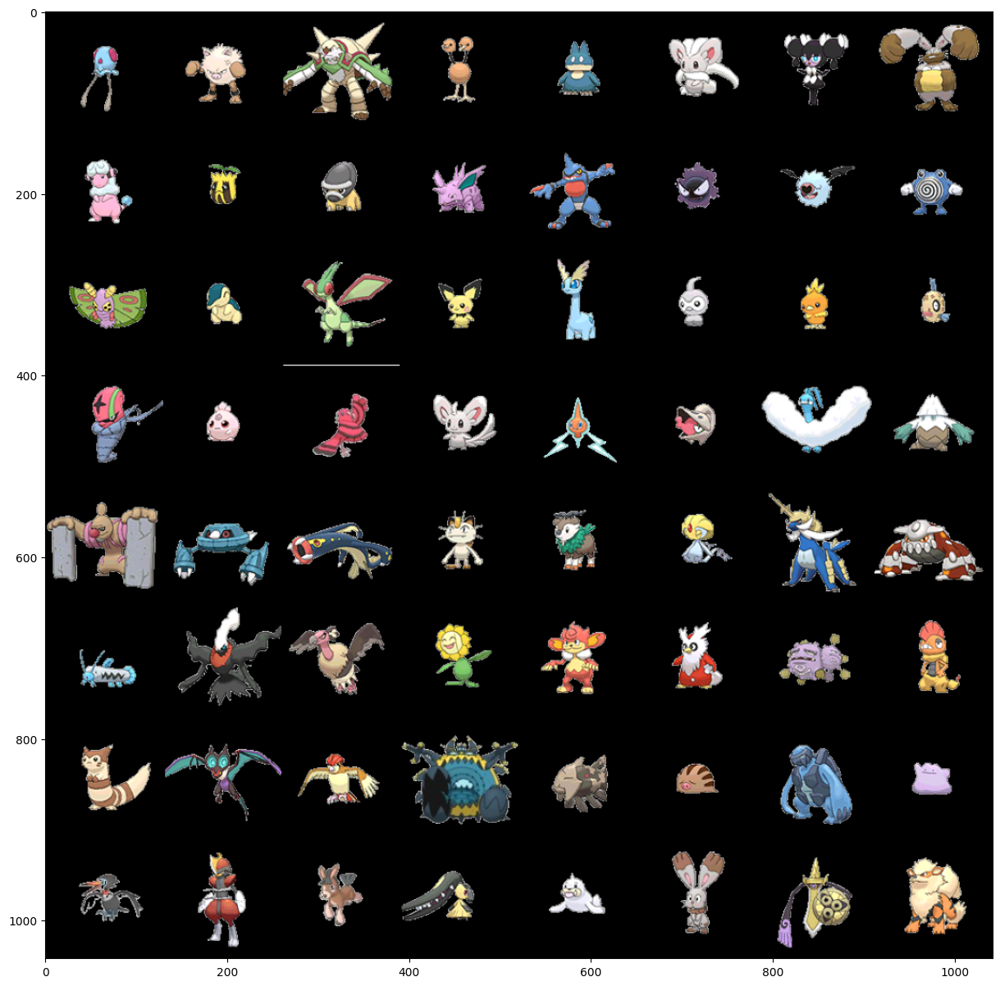

In [6]:
tsfm = transforms.Compose([
    transforms.Resize(128),
    transforms.CenterCrop(128),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5,0.5,0.5), std=(0.5,0.5,0.5))
])
dataset = dset.ImageFolder(root="Pokemon", transform=tsfm)

dataloader = DataLoader(dataset, batch_size=config["batch_size"], shuffle=True, num_workers=4)
batch = next(iter(dataloader))[0]
plt.figure(figsize=(15,15))
plt.imshow(np.transpose(vutils.make_grid(batch[:64], padding=2, normalize=True),(1,2,0)))

# DCGAN Architecture

In [10]:
def deconv_block(in_dim, out_dim, kernel, stride, padding):
    block = nn.Sequential(
        nn.ConvTranspose2d(in_dim, out_dim, kernel, stride, padding, bias=False),
        nn.BatchNorm2d(out_dim),
        nn.ReLU(inplace=True)
    )
    return block

def conv_block(in_dim, out_dim, kernel, stride, padding):
    block = nn.Sequential(
        nn.Conv2d(in_dim, out_dim, kernel, stride, padding, bias=False),
        nn.BatchNorm2d(out_dim),
        nn.LeakyReLU(0.2, inplace=True)
    )
    return block

class Generator(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.layers = nn.Sequential(
            deconv_block(input_dim, 512, 4, 1, 0), # (4,4)
            deconv_block(512, 256, 4, 2, 1), # (8,8)
            deconv_block(256, 128, 4, 2, 1), # (16,16)
            deconv_block(128, 64, 4, 2, 1), # (32,32)
            deconv_block(64, 32, 4, 2, 1), # (64,64)
            nn.ConvTranspose2d(32, 3, 4, 2, 1), # (128, 128)
            #nn.ConvTranspose2d(64, 3, 4, 2, 1), # (64, 64)
            nn.Tanh()
        )
        return

    def forward(self, x):
        x = x.view(x.size()[0], x.size()[1], 1, 1)
        return self.layers(x)


class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.layers = nn.Sequential(
            #nn.Conv2d(3, 64, 4, 2, 1),
            nn.Conv2d(3, 32, 4, 2, 1), # (64)
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(32, 64, 4, 2, 1), # (32)
            nn.LeakyReLU(0.2, inplace=True),
            conv_block(64, 128, 4, 2, 1), # (16, 16)
            conv_block(128, 256, 4, 2, 1), # (8, 8)
            conv_block(256, 512, 4, 2, 1), # (4, 4)
            nn.Conv2d(512, 1, 4, 1, 0), # (1, 1)
            nn.Sigmoid()
        )
        return

    def forward(self, x):
        return self.layers(x)

#  Initial weights normarlization

In [14]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [17]:
same_seed(config["seed"])
netG = Generator(100).to(device)
netD = Discriminator().to(device)
netG.apply(weights_init)
netD.apply(weights_init)

criterion = nn.BCELoss()
optimizerD = torch.optim.Adam(netD.parameters(), lr=config["lr"], betas=(config["beta"], 0.99))
optimizerG = torch.optim.Adam(netG.parameters(), lr=config["lr"], betas=(config["beta"], 0.99))

fixed_noise = torch.randn(config["batch_size"], 100).to(device)

In [18]:
history = dict(avgLossD=[], avgLossG=[])
imgs_list = []
for epoch in range(config["epochs"]):
    #train_pbar = tqdm(dataloader)
    avgLossD = []
    avgLossG = []

    for batch in dataloader:
        real = batch[0].to(device)

        # updating netD
        netD.zero_grad()
        real_pred = netD(real).view(-1)
        real_loss = criterion(real_pred, torch.ones_like(real_pred).to(device))
        real_loss.backward()

        noise = torch.randn(config["batch_size"], 100).to(device)
        fake = netG(noise)
        fake_pred = netD(fake.detach()).view(-1)
        fake_loss = criterion(fake_pred, torch.zeros_like(fake_pred).to(device))
        fake_loss.backward()
        lossD = real_loss + fake_loss
        optimizerD.step()

        # updating netG
        netG.zero_grad()
        fake_pred = netD(fake).view(-1)
        lossG = criterion(fake_pred, torch.ones_like(fake_pred).to(device))
        lossG.backward()
        optimizerG.step()
        avgLossD.append(lossD.detach().item())
        avgLossG.append(lossG.detach().item())
        #print(f"Epoch: {epoch+1} - LossD:{lossD:.4f} | LossG:{lossG:.4f}")

    avgLossD = np.mean(avgLossD)
    avgLossG = np.mean(avgLossG)
    history["avgLossD"].append(avgLossD)
    history["avgLossG"].append(avgLossG)

    print(f"Epoch: {epoch+1} - avgLossD:{avgLossD:.4f} | avgLossG:{avgLossG:.4f}")

    if (epoch+1) % 100 == 0:
        fake = netG(fixed_noise)
        imgs_list.append(vutils.make_grid(fake.detach().cpu(), padding=True, normalize=True))
        print(len(imgs_list))


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch: 1 - avgLossD:0.5280 | avgLossG:3.5461
Epoch: 2 - avgLossD:0.0775 | avgLossG:4.6650
Epoch: 3 - avgLossD:0.0354 | avgLossG:5.3286
Epoch: 4 - avgLossD:0.0238 | avgLossG:5.8034
Epoch: 5 - avgLossD:0.0181 | avgLossG:6.1103
Epoch: 6 - avgLossD:0.0136 | avgLossG:6.3622
Epoch: 7 - avgLossD:0.0111 | avgLossG:6.6962
Epoch: 8 - avgLossD:0.0090 | avgLossG:6.9169
Epoch: 9 - avgLossD:0.0074 | avgLossG:7.0044
Epoch: 10 - avgLossD:0.0064 | avgLossG:7.1164
Epoch: 11 - avgLossD:0.0053 | avgLossG:7.2261
Epoch: 12 - avgLossD:0.0046 | avgLossG:7.3506
Epoch: 13 - avgLossD:0.0043 | avgLossG:7.4164
Epoch: 14 - avgLossD:0.0039 | avgLossG:7.5389
Epoch: 15 - avgLossD:0.0036 | avgLossG:7.5851
Epoch: 16 - avgLossD:0.0032 | avgLossG:7.5707
Epoch: 17 - avgLossD:0.0032 | avgLossG:7.6528
Epoch: 18 - avgLossD:0.0030 | avgLossG:7.8200
Epoch: 19 - avgLossD:0.0032 | avgLossG:7.8759
Epoch: 20 - avgLossD:0.0024 | avgLossG:7.9925
Epoch: 21 - avgLossD:0.0023 | avgLossG:8.0284
Epoch: 22 - avgLossD:0.0022 | avgLossG:8.15

<Axes: >

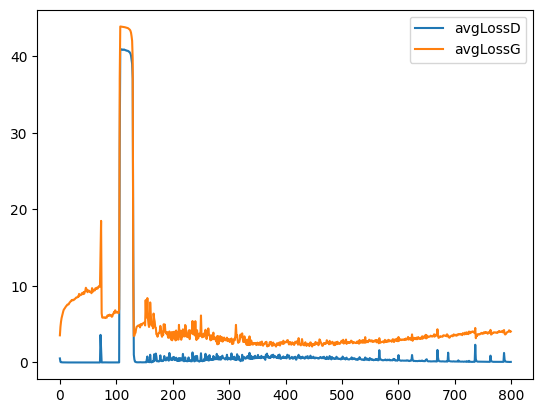

In [19]:
df = pd.DataFrame(history)
df.plot()

In [20]:
%matplotlib inline
import matplotlib.animation as animation
from IPython.display import HTML

8


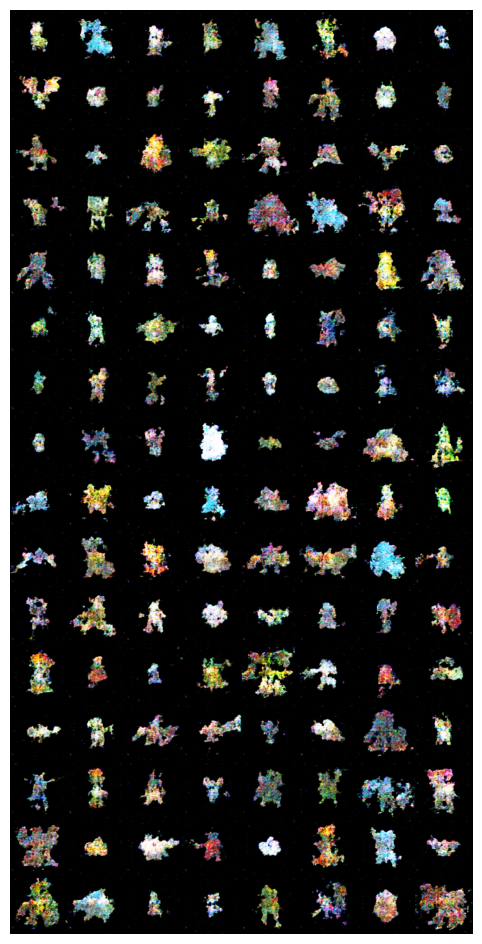

In [21]:
#%%capture
fig = plt.figure(figsize=(12,12))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in imgs_list]
print(len(ims))
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

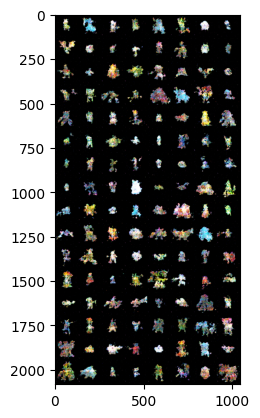

In [26]:
# result on fixed noise
with torch.no_grad():
    fake = netG(fixed_noise).detach().cpu()
plt.imshow(np.transpose(vutils.make_grid(fake, padding=2, normalize=True), (1,2,0)))

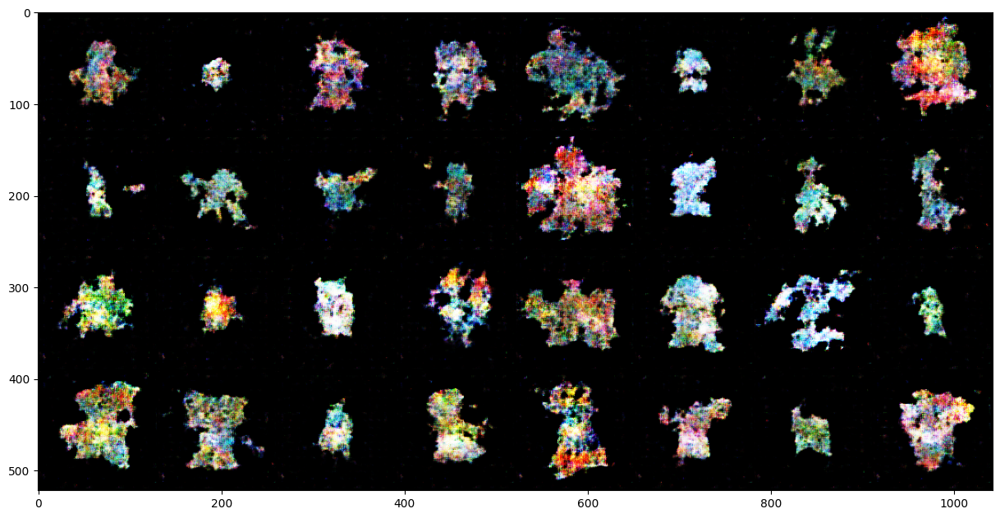

In [30]:
# result on random noise
noise = torch.randn(32, 100).to(device)
with torch.no_grad():
    fake = netG(noise).detach().cpu()
plt.figure(figsize=(15,15))
plt.imshow(np.transpose(vutils.make_grid(fake, padding=2, normalize=True), (1,2,0)))

In [28]:
from google.colab import drive
drive.mount("Drive")

Mounted at Drive


In [31]:
# saving model
torch.save(netG.state_dict(), "PokemonNetG.pth")
torch.save(netD.state_dict(), "PokemonNetD.pth")

! scp PokemonNetG.pth /content/Drive/MyDrive/MyAIProjects/PokemonGAN
! scp PokemonNetD.pth /content/Drive/MyDrive/MyAIProjects/PokemonGAN